<a href="https://colab.research.google.com/github/atonendeley/CE880-Data-Science/blob/main/Assignment/%20Project%20Abalone/%20CE880_Abalone_Project_Assignment_06012022_v2_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Atonye Endeley 2103195 Abalone Project Assignment Part 1 Regression and Classification with Hyperparameters**

Import Libraries


In [ ]:
%matplotlib inline

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d  import Axes3D
from pandas_profiling import ProfileReport

from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler

from sklearn.ensemble import  RandomForestRegressor
from sklearn.ensemble import BaggingRegressor

import lightgbm as lgb

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split


import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import RandomizedSearchCV
import tensorflow as tf
from keras.models import Sequential,model_from_json
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import optimizers

from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import losses
from tensorflow.keras import callbacks

Import data



In [ ]:
data = pd.read_csv('abalone.csv')

In [ ]:
data.head()

,Sex,Length,Diameter,Height,Whole weight,Shucked weight,Viscera weight,Shell weight,Rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


In [ ]:
data['Age'] = data['Rings']+1.5
data.drop('Rings', axis = 1, inplace = True)


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f05dbc141d0>,
      dtype=object)

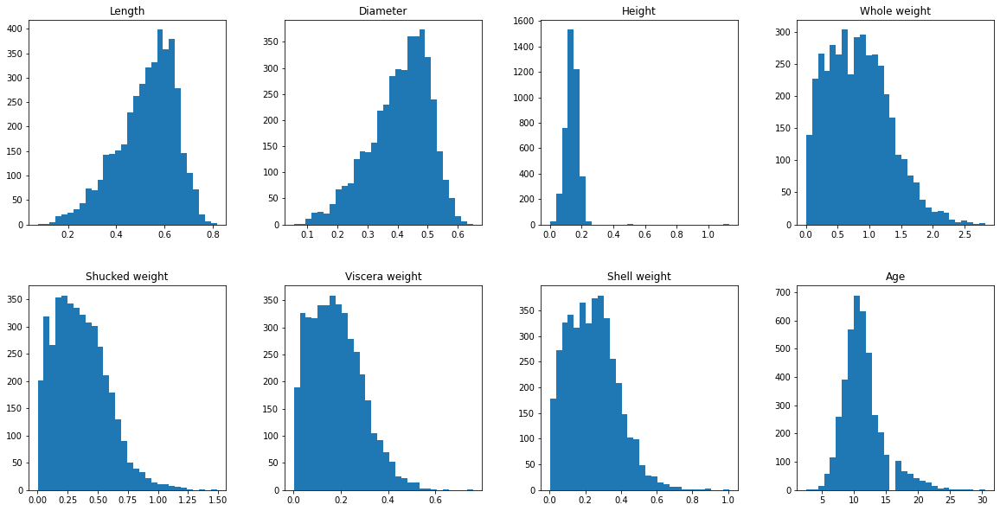

In [ ]:
# Visualisation histogram setup attribute dataset Abalone
data.hist(figsize=(20,10), grid=False, layout=(2, 4), bins = 30)

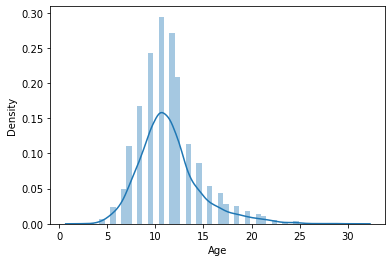

In [ ]:
# Histogram Descriptive visualisation distribution for output attribute age

import seaborn as sb
sb.distplot(data['Age'])

In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [ ]:
profile = ProfileReport(data, title='Pandas Profiling Report', html ={'style':{'full_width': False}})


In [ ]:
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile = ProfileReport(data)
profile



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file(output_file="Report.html")


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
! ls

abalone.csv  Report.html  sample_data


In [ ]:
! cat Report.html

Streaming output truncated to the last 5000 lines.
Q 46.6875 8.109375 53.6875 14.9375 
Q 60.6875 21.78125 60.6875 36.53125 
Q 60.6875 51.171875 53.6875 57.984375 
Q 46.6875 64.796875 31.59375 64.796875 
z
M 9.8125 72.90625 
L 30.078125 72.90625 
Q 51.265625 72.90625 61.171875 64.09375 
Q 71.09375 55.28125 71.09375 36.53125 
Q 71.09375 17.671875 61.125 8.828125 
Q 51.171875 0 30.078125 0 
L 9.8125 0 
z
"/><path id=DejaVuSans-97 d="M 34.28125 27.484375 
Q 23.390625 27.484375 19.1875 25 
Q 14.984375 22.515625 14.984375 16.5 
Q 14.984375 11.71875 18.140625 8.90625 
Q 21.296875 6.109375 26.703125 6.109375 
Q 34.1875 6.109375 38.703125 11.40625 
Q 43.21875 16.703125 43.21875 25.484375 
L 43.21875 27.484375 
z
M 52.203125 31.203125 
L 52.203125 0 
L 43.21875 0 
L 43.21875 8.296875 
Q 40.140625 3.328125 35.546875 0.953125 
Q 30.953125 -1.421875 24.3125 -1.421875 
Q 15.921875 -1.421875 10.953125 3.296875 
Q 6 8.015625 6 15.921875 
Q 6 25.140625 12.171875 29.828125 
Q 18.359375 34.515625 30.6093

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Exploratory Data Analysis

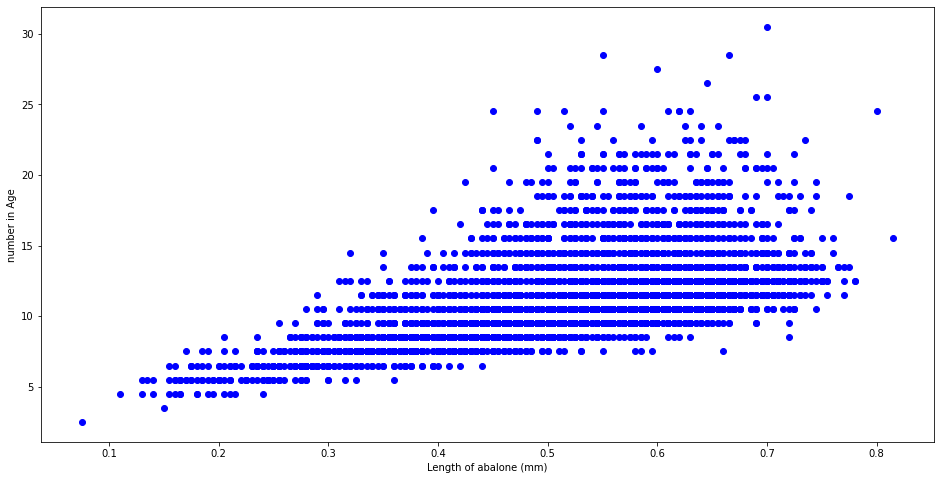

In [ ]:
plt.figure(figsize=(16,8))
plt.scatter(data['Length'], data['Age'],c='blue')
plt.xlabel('Length of abalone (mm)')
plt.ylabel('number in Age')
plt.show()

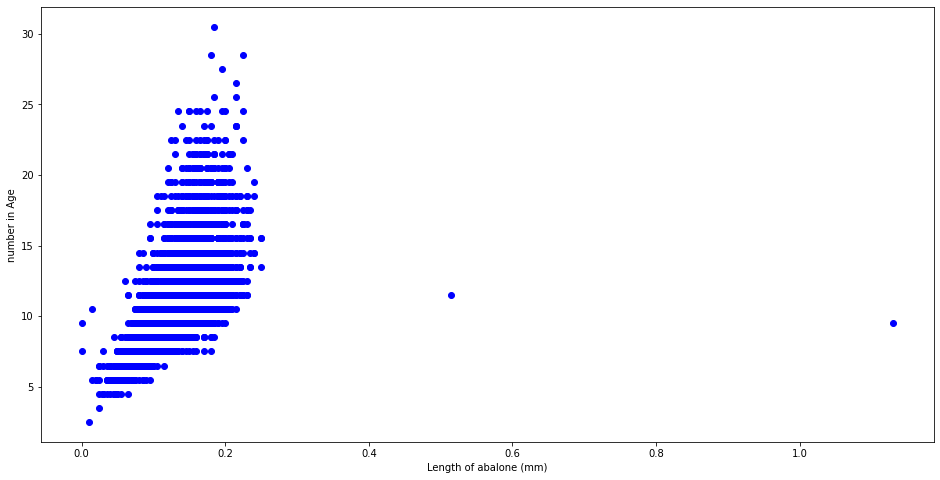

In [ ]:
plt.figure(figsize=(16,8))
plt.scatter(data['Height'], data['Age'],c='blue')
plt.xlabel('Length of abalone (mm)')
plt.ylabel('number in Age')
plt.show()

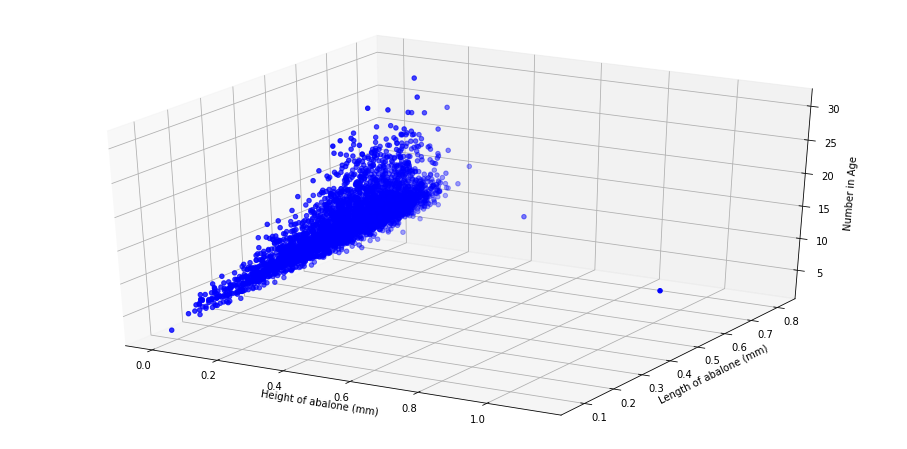

In [ ]:
fig = plt.figure(figsize=(16,8))
ax = plt.axes(projection='3d')

ax.set_xlabel('Height of abalone (mm)')
ax.set_ylabel('Length of abalone (mm)')
ax.set_zlabel('Number in Age')
ax.scatter3D(data['Height'], data['Length'], data['Age'], c='blue');

plt.show()

Hot Encoding

In [ ]:
encoded_data = pd.get_dummies(data)
encoded_data.head()

print(encoded_data.shape)

(4177, 11)


**Modelling **
Spliting of Dataset (Training and Test)

In [ ]:
training_set = encoded_data.iloc[:4099, :]
validation_set = encoded_data.iloc[4099:, :]

print(validation_set.shape)
print(training_set.shape)

(78, 11)
(4099, 11)




```
# This is formatted as code
```

Multilinear Regression

In [ ]:
X = training_set[['Length', 'Height']]
y = training_set['Age'].values.reshape(-1,1)

X_val = validation_set[['Length', 'Height']]
y_val = validation_set['Age'].values.reshape(-1,1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)


In [ ]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

lin_reg_pred = lin_reg.predict(X_test)

#Test set RMSE
test_rmse = mean_squared_error(y_test, lin_reg_pred, squared=False)
print(f'Test RMSE: {test_rmse}')

#Validation set RMSE
lin_reg_pred_val =lin_reg.predict(X_val)
val_rmse = mean_squared_error(lin_reg_pred_val, y_val, squared=False)

print(f'Validation RMSE:{val_rmse}')

Test RMSE: 2.5679099174951547
Validation RMSE:1.566178378231162



Regularization: Multiple linear regression (Ridge Regression)



In [ ]:
ridge = Ridge()

parameters = {'alpha': [1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20]}

ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_root_mean_squared_error', cv=5)

ridge_regressor.fit(X_train, y_train);

print(ridge_regressor.best_params_)
print(-ridge_regressor.best_score_)



{'alpha': 1}
2.6564563658448885


In [ ]:
ridge_reg = Ridge(alpha=1)
ridge_reg.fit(X_train, y_train)

ridge_reg_pred = ridge_reg.predict(X_test)

#Test RMSE
test_rmse = mean_squared_error(y_test, ridge_reg_pred, squared=False)
print(f'Test RMSE: {test_rmse}')

#Validation RMSE
ridge_reg_pred_val = ridge_reg.predict(X_val)
val_rmse = mean_squared_error(y_val, ridge_reg_pred_val, squared=False)

print(f'Validation RMSE: {val_rmse}')

Test RMSE: 2.5871300097108296
Validation RMSE: 1.5640813253014876


Multiple linear regression with regularization (lasso)

```
# This is formatted as code
```



In [ ]:
lasso = Lasso(tol=0.05)

parameters = {'alpha': [1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20]}

lasso_regressor = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv=5)

lasso_regressor.fit(X_train, y_train)

print(lasso_regressor.best_params_)
print(-lasso_regressor.best_score_)


{'alpha': 0.01}
7.130917624445476


In [ ]:
lasso_reg = Lasso(alpha=0.01)
lasso_reg.fit(X_train, y_train)

lasso_reg_pred = lasso_reg.predict(X_test)

# Test RMSE
test_rmse = mean_squared_error(y_test, lasso_reg_pred, squared=False)
print(f'Test RMSE: {test_rmse}')

# Validation RMSE
lasso_reg_pred_val = lasso_reg.predict(X_val)
val_rmse = mean_squared_error(y_val, lasso_reg_pred_val, squared=False)

print(f'Validation RMSE: {val_rmse}')



Test RMSE: 2.610473125813745
Validation RMSE: 1.5563831232308802


Decision-tree based models

In [ ]:
X = training_set.drop(['Age', 'Diameter', 'Whole weight','Shucked weight','Viscera weight', 'Shell weight'], axis=1)
y = training_set['Age'].values.reshape(-1,1)

X_val = validation_set.drop(['Age', 'Diameter', 'Whole weight', 'Shucked weight', 'Viscera weight','Shell weight'], axis =1)
y_val = validation_set['Age'].values.reshape(-1,1)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)


In [ ]:
rf = RandomForestRegressor()

parameters = {'n_estimators': [int(x) for x in np.linspace(100, 1000, 10)]}

rf_regressor = GridSearchCV(rf, parameters, scoring='neg_mean_squared_error', cv=5)
rf_regressor.fit(X_train, y_train.ravel())

print(rf_regressor.best_params_)
print(-rf_regressor.best_score_)


{'n_estimators': 400}
8.395336872205812


In [ ]:
rf_reg = RandomForestRegressor(n_estimators=300)
rf_reg.fit(X_train, y_train.ravel())

rf_reg_pred = rf_reg.predict(X_test)

# Test RMSE
test_rmse = mean_squared_error(y_test, rf_reg_pred, squared=False)
print(f'Test RMSE: {test_rmse}')

# Validation RMSE
rf_reg_pred_val = rf_reg.predict(X_val)
val_rmse = mean_squared_error(y_val, rf_reg_pred_val, squared=False)

print(f'Validation RMSE: {val_rmse}')


Test RMSE: 2.63417926643497
Validation RMSE: 2.2657379549588774


**Random** **forest**

LightGBM

In [ ]:
params = {'learning_rate': '0.01'}

train_data = lgb.Dataset(X_train.values, label=y_train.ravel())


lgb_reg = lgb.train(params, train_data, 100)


In [ ]:
lgb_reg_pred = lgb_reg.predict(X_test)

# Test RMSE
test_rmse = mean_squared_error(y_test, lgb_reg_pred, squared=False)
print(f'Test RMSE: {test_rmse}')

# Validation RMSE
lgb_reg_pred_val = lgb_reg.predict(X_val)
val_rmse = mean_squared_error(y_val, lgb_reg_pred_val, squared=False)
print(f'Validation RMSE: {val_rmse}') 



Test RMSE: 2.5516374432050553
Validation RMSE: 1.509731011496681


In [ ]:
data = pd.DataFrame(data)
print(data)

     Sex  Length  Diameter  ...  Viscera weight  Shell weight   Age
0      M   0.455     0.365  ...          0.1010        0.1500  16.5
1      M   0.350     0.265  ...          0.0485        0.0700   8.5
2      F   0.530     0.420  ...          0.1415        0.2100  10.5
3      M   0.440     0.365  ...          0.1140        0.1550  11.5
4      I   0.330     0.255  ...          0.0395        0.0550   8.5
...   ..     ...       ...  ...             ...           ...   ...
4172   F   0.565     0.450  ...          0.2390        0.2490  12.5
4173   M   0.590     0.440  ...          0.2145        0.2605  11.5
4174   M   0.600     0.475  ...          0.2875        0.3080  10.5
4175   F   0.625     0.485  ...          0.2610        0.2960  11.5
4176   M   0.710     0.555  ...          0.3765        0.4950  13.5

[4177 rows x 9 columns]


In [ ]:
rmse_compilation = { 
    'model': ['linear regression', 'ridge regression', 'lasso', 'random forest', 
              'lightGBM'],
    'RMSE': [1.5662, 1.5641, 1.5564, 2.2334, 1.5097]

}
rmse_data = pd.DataFrame(data=rmse_compilation)
rmse_data.sort_values (by=['RMSE'], ascending=True)


,model,RMSE
4,lightGBM,1.5097
2,lasso,1.5564
1,ridge regression,1.5641
0,linear regression,1.5662
3,random forest,2.2334


Hyperparameter **Optimization**

Random Search for Regression


In [ ]:
# split into input and output elements
from sklearn.model_selection import RepeatedKFold
# define model
model = Ridge()
# define evaluation
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# define search space
from scipy.stats import loguniform

space = dict()
space['solver'] = ['svd', 'cholesky', 'lsqr', 'sag']
space['alpha'] = loguniform(1e-5, 100)
space['fit_intercept'] = [True, False]
space['normalize'] = [True, False]

In [ ]:
# define search
search = RandomizedSearchCV(model, space, n_iter=500, scoring='neg_mean_absolute_error', n_jobs=-1, cv=cv, random_state=1)

In [ ]:
# execute search
result = search.fit(X, y)
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: -1.8207681561403635
Best Hyperparameters: {'alpha': 89.99600718351375, 'fit_intercept': False, 'normalize': False, 'solver': 'sag'}


In [ ]:
# define model
model = LogisticRegression()

**Random** **Search** **for** **Classification**


model configurations using repeated stratified k-fold cross-validation with three repeats and 10 folds

In [ ]:
# define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

In [ ]:
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)

In [ ]:
# define search
search = RandomizedSearchCV(model, space, n_iter=500, scoring='accuracy', n_jobs=-1, cv=cv, random_state=1)

In [ ]:
# execute search
result = search.fit(X, y)
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: -1.8208146161970216
Best Hyperparameters: {'alpha': 89.99600718351375, 'fit_intercept': False, 'normalize': False, 'solver': 'sag'}
